# Proyek Klasifikasi Gambar: [RealWaste]
- **Nama:** Annisa Nabila Mumtaz
- **Informasi Dataset:** Dataset RealWaste RealWaste adalah kumpulan data gambar yang dikumpulkan dari bahan limbah yang diterima di fasilitas Whyte's Gully Waste and Resource Recovery di Wollongong NSW Australia. Ada beberapa label yang akan diklasifikasi :
  *   Cardboard
  *   Food Organics
  *   Glass
  *   Metal
  *   Miscellaneous Trash
  *   Paper
  *   Plastic
  *   Textile Trash
  *   Vegetation

Kutipan karya asli : [RealWaste: A Novel Real-Life Data Set for Landfill Waste Classification Using Deep Learning.](https://www.mdpi.com/2078-2489/14/12/633)
Data ini dilisensikan di bawah CC BY-NC-SA 4.0.

## Import Semua Packages/Library yang Digunakan

In [1]:
# Library yang sering digunakan
import os, shutil
import zipfile
import random
from random import sample
import shutil
from shutil import copyfile
import pathlib
from pathlib import Path
import numpy as np
import pandas as pd
from tqdm.notebook import tqdm as tq

# Library untuk visualisasi
%matplotlib inline
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.image import imread

# Library untuk memproses data gambar
import cv2
from PIL import Image
import skimage
from skimage import io
from skimage.transform import resize
from skimage.transform import rotate, AffineTransform, warp
from skimage import img_as_ubyte
from skimage.exposure import adjust_gamma
from skimage.util import random_noise

# Library untuk membuat dan mengevaluasi model
import keras
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report
import tensorflow as tf
from tensorflow.keras import Model, layers
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator, img_to_array, load_img
from tensorflow.keras.optimizers import Adam, RMSprop, SGD
from tensorflow.keras.layers import InputLayer, Conv2D, SeparableConv2D, MaxPooling2D, MaxPool2D, Dense, Flatten, Dropout, BatchNormalization
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.applications import MobileNet
from tensorflow.keras.applications.mobilenet_v2 import MobileNetV2
from tensorflow.keras.applications.densenet import DenseNet121
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import ModelCheckpoint, Callback, EarlyStopping, ReduceLROnPlateau

# Untuk mengabaikan peringatan
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

In [2]:
# Mencetak versi Tensorflow yang digunakan
print(tf.__version__)

2.19.0


## Data Preparation

### Data Loading

In [3]:
import os
import requests
import zipfile

# Load dataset
url = "https://archive.ics.uci.edu/static/public/908/realwaste.zip"
zip_path = "realwaste.zip"
extract_dir = "realwaste_data"

# Cek apakah dataset sudah diekstrak
if not os.path.exists(os.path.join(extract_dir, "realwaste-main", "RealWaste")):
    print("Dataset belum diekstrak, mengunduh file ZIP...")

    # Unduh file ZIP
    if not os.path.exists(zip_path):
        r = requests.get(url)
        with open(zip_path, "wb") as f:
            f.write(r.content)
        print("Unduhan selesai!")

    print("Mengekstrak dataset")
    os.system(f"unzip -q {zip_path} -d {extract_dir}")
    print("Ekstraksi selesai!")
else:
    print("Dataset sudah ada, tidak perlu ekstraksi ulang")

Dataset belum diekstrak, mengunduh file ZIP...
Unduhan selesai!
Mengekstrak dataset
Ekstraksi selesai!


Gabung data dari setiap label ke direktori yang sama

In [4]:
import os
import shutil

# Direktori awal untuk train dan test
cardboard_dir = "realwaste_data/realwaste-main/RealWaste/Cardboard"
foodOrganic_dir = "realwaste_data/realwaste-main/RealWaste/Food Organics"
glass_dir = "realwaste_data/realwaste-main/RealWaste/Glass"
metal_dir = "realwaste_data/realwaste-main/RealWaste/Metal"
miscellaneousTrash_dir = "realwaste_data/realwaste-main/RealWaste/Miscellaneous Trash"
paper_dir = "realwaste_data/realwaste-main/RealWaste/Paper"
plastic_dir = "realwaste_data/realwaste-main/RealWaste/Plastic"
textileTrash_dir = "realwaste_data/realwaste-main/RealWaste/Textile Trash"
vegetation_dir = "realwaste_data/realwaste-main/RealWaste/Vegetation"

# Direktori baru untuk dataset gabungan
combined_dir = "waste/dataset"

# Buat direktori baru
os.makedirs(combined_dir, exist_ok=True)

# Fungsi bantu untuk menyalin semua file ke satu folder
def copy_all_images(source_dir, target_dir, label_name):
    for file in os.listdir(source_dir):
        src = os.path.join(source_dir, file)
        if os.path.isfile(src):
            dst = os.path.join(target_dir, f"{label_name}_{file}")
            shutil.copy2(src, dst)

# Gabungkan semua gambar dari train dan test
copy_all_images(cardboard_dir, combined_dir, "Cardboard")
copy_all_images(foodOrganic_dir, combined_dir, "FoodOrganics")
copy_all_images(glass_dir, combined_dir, "Glass")
copy_all_images(metal_dir, combined_dir, "Metal")
copy_all_images(miscellaneousTrash_dir, combined_dir, "MiscTrash")
copy_all_images(paper_dir, combined_dir, "Paper")
copy_all_images(plastic_dir, combined_dir, "Plastic")
copy_all_images(textileTrash_dir, combined_dir, "TextileTrash")
copy_all_images(vegetation_dir, combined_dir, "Vegetation")

print("Semua gambar label berhasil digabung jadi satu folder:")
print("Folder gabungan:", combined_dir)

Semua gambar label berhasil digabung jadi satu folder:
Folder gabungan: waste/dataset


In [5]:
print(os.listdir("waste/dataset"))

['FoodOrganics_Food Organics_388.jpg', 'Vegetation_Vegetation_385.jpg', 'Plastic_Plastic_639.jpg', 'Metal_Metal_554.jpg', 'Cardboard_Cardboard_75.jpg', 'Vegetation_Vegetation_203.jpg', 'Metal_Metal_716.jpg', 'Plastic_Plastic_904.jpg', 'MiscTrash_Miscellaneous Trash_86.jpg', 'Metal_Metal_701.jpg', 'Metal_Metal_185.jpg', 'MiscTrash_Miscellaneous Trash_224.jpg', 'Plastic_Plastic_605.jpg', 'Plastic_Plastic_151.jpg', 'MiscTrash_Miscellaneous Trash_329.jpg', 'MiscTrash_Miscellaneous Trash_46.jpg', 'FoodOrganics_Food Organics_63.jpg', 'Vegetation_Vegetation_204.jpg', 'Glass_Glass_392.jpg', 'Metal_Metal_722.jpg', 'Paper_Paper_276.jpg', 'Cardboard_Cardboard_126.jpg', 'Metal_Metal_250.jpg', 'Glass_Glass_379.jpg', 'Metal_Metal_640.jpg', 'Metal_Metal_516.jpg', 'MiscTrash_Miscellaneous Trash_212.jpg', 'FoodOrganics_Food Organics_255.jpg', 'MiscTrash_Miscellaneous Trash_408.jpg', 'FoodOrganics_Food Organics_85.jpg', 'Plastic_Plastic_310.jpg', 'Metal_Metal_164.jpg', 'Metal_Metal_569.jpg', 'Metal_Meta

Melihat jumlah gambar dan ukuran resolusi

In [6]:
import cv2
from collections import Counter
import os

# Path ke folder dataset gabungan
dataset_path = "waste/dataset"

# List untuk menyimpan resolusi dan dictionary untuk menghitung gambar per kategori
resolutions = []
image_counts = {}

# Loop langsung ke file gambar (karena sudah tanpa subfolder)
for img_file in os.listdir(dataset_path):
    img_path = os.path.join(dataset_path, img_file)

    # Baca gambar menggunakan OpenCV
    img = cv2.imread(img_path)

    if img is not None:
        # Simpan resolusi (tinggi, lebar)
        resolutions.append(img.shape[:2])

        # Ambil kategori dari prefix nama file, misal 'cat_123.jpg' → 'cat'
        category = img_file.split('_')[0]

        # Tambahkan ke penghitung kategori
        image_counts[category] = image_counts.get(category, 0) + 1

# Hitung jumlah gambar dengan setiap resolusi unik
resolution_counts = Counter(resolutions)

# Cetak jumlah gambar per kategori
print("Jumlah gambar per kategori:")
for category, count in image_counts.items():
    print(f"- {category}: {count}")

# Cetak hasil resolusi
print("\nJumlah gambar per resolusi:")
for res, count in resolution_counts.items():
    print(f"- Resolusi: {res}, Jumlah Gambar: {count}")

# Cek apakah semua gambar memiliki resolusi seragam atau tidak
if len(resolution_counts) > 1:
    print("\n Gambar dalam dataset memiliki resolusi yang TIDAK seragam.")
else:
    print("\n Gambar dalam dataset memiliki resolusi yang SERAGAM.")

Jumlah gambar per kategori:
- FoodOrganics: 411
- Vegetation: 436
- Plastic: 921
- Metal: 790
- Cardboard: 461
- MiscTrash: 495
- Glass: 420
- Paper: 500
- TextileTrash: 318

Jumlah gambar per resolusi:
- Resolusi: (524, 524), Jumlah Gambar: 4752

 Gambar dalam dataset memiliki resolusi yang SERAGAM.


Plot gambar sampel untuk semua kelas

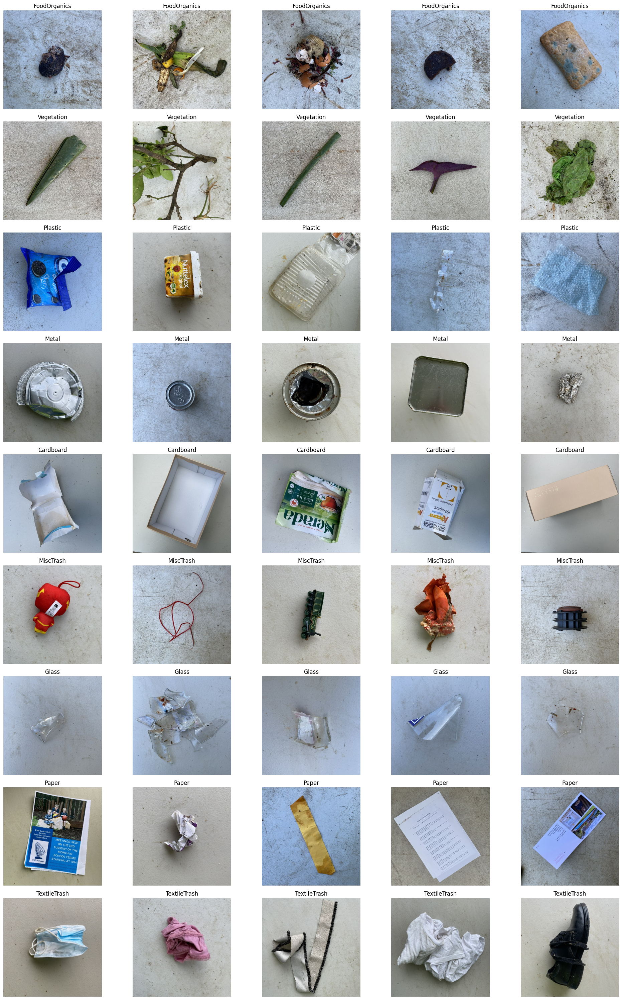

In [7]:
import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# Path dataset
dataset_path = "waste/dataset"

# Membuat kamus untuk menyimpan gambar per kelas
waste_image = {}

# Mengelompokkan gambar berdasarkan prefix nama file
for img_file in os.listdir(dataset_path):
    if not img_file.lower().endswith(('.jpg')):
        continue  # lewati file non-gambar

    category = img_file.split('_')[0]
    if category not in waste_image:
        waste_image[category] = []
    waste_image[category].append(img_file)

# Pilih semua kelas
sample_classes = list(waste_image.keys())

# Buat subplot: 3 baris (kelas) × 5 kolom (gambar per kelas)
fig, axs = plt.subplots(len(sample_classes), 5, figsize=(20, 30))

for i, class_name in enumerate(sample_classes):
    images = np.random.choice(waste_image[class_name], 5, replace=False)

    for j, image_name in enumerate(images):
        img_path = os.path.join(dataset_path, image_name)
        img = Image.open(img_path).convert("RGB")

        axs[i, j].imshow(img)
        axs[i, j].set_title(class_name)
        axs[i, j].axis("off")

plt.tight_layout()
plt.show()

Plot distribusi gambar di seluruh kelas

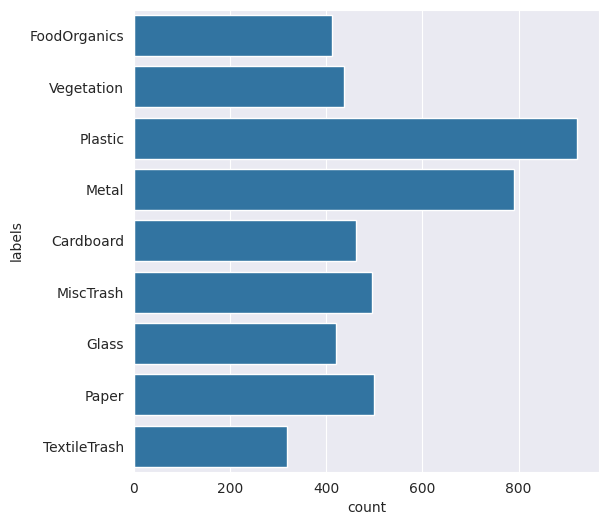

In [8]:
# Definisikan source path
dataset_path = "waste/dataset"

# Buat daftar yang menyimpan data untuk setiap nama file, path file, dan label dalam data
file_name = []
labels = []
full_path = []

# Ambil data nama file gambar, path file, dan label satu per satu dengan looping, dan simpan sebagai dataframe
for name in os.listdir(dataset_path):
    if name.endswith('.jpg'):
        full_path.append(os.path.join(dataset_path, name))
        label = name.split('_')[0]
        labels.append(label)
        file_name.append(name)

distribution_train = pd.DataFrame({"path": full_path, "file_name": file_name, "labels": labels})

# Plot distribusi gambar setiap kelas
Label = distribution_train['labels']
plt.figure(figsize = (6,6))
sns.set_style("darkgrid")
plot_data = sns.countplot(Label)

Data Augmentation

In [9]:
from collections import defaultdict

# Path dataset
dataset_path = "waste/dataset"
augmented_path = dataset_path  # Simpan di folder yang sama

# Fungsi Augmentasi
def anticlockwise_rotation(img):
    img = cv2.resize(img, (224, 224))
    angle = random.randint(10, 90)
    return rotate(img, angle)

def clockwise_rotation(img):
    img = cv2.resize(img, (224, 224))
    angle = random.randint(10, 90)
    return rotate(img, -angle)

def flip_up_down(img):
    img = cv2.resize(img, (224, 224))
    return np.flipud(img)

def flip_left_right(img):
    img = cv2.resize(img, (224, 224))
    return np.fliplr(img)

def add_brightness(img):
    img = cv2.resize(img, (224, 224))
    return adjust_gamma(img, gamma=random.uniform(0.6, 1.4))

def blur_image(img):
    img = cv2.resize(img, (224, 224))
    return cv2.GaussianBlur(img, (5, 5), 0)

def sheared(img):
    img = cv2.resize(img, (224, 224))
    transform = AffineTransform(shear=random.uniform(-0.2, 0.2))
    return warp(img, transform, mode="wrap")

def warp_shift(img):
    img = cv2.resize(img, (224, 224))
    transform = AffineTransform(translation=(random.randint(-30, 30), random.randint(-30, 30)))
    return warp(img, transform, mode="wrap")


# Daftar transformasi
transformations = {
    'rotate anticlockwise': anticlockwise_rotation,
    'rotate clockwise': clockwise_rotation,
    'flip up down': flip_up_down,
    'flip left right': flip_left_right,
    'add brightness': add_brightness,
    'blur image': blur_image,
    'shear image': sheared,
    'warp shift': warp_shift
}

# Lihat jumlah gambar per kelas
class_images = defaultdict(list)
for filename in os.listdir(dataset_path):
    if filename.endswith((".jpg", ".jpeg", ".png")):
        label = filename.split("_")[0]  # Ambil prefix nama kategori
        class_images[label].append(os.path.join(dataset_path, filename))

# Hitung jumlah gambar per kelas
class_counts = {label: len(files) for label, files in class_images.items()}

print("Jumlah gambar per kelas sebelum augmentasi:")
for k, v in class_counts.items():
    print(f"{k}: {v}")

# Tentukan target jumlah gambar untuk menyeimbangkan dengan jumlah kelas terbanyak
max_images = max(class_counts.values())

# Loop melalui setiap kategori yang membutuhkan augmentasi
for label, files in class_images.items():
    count = len(files)
    if count < max_images:
        to_generate = max_images - count
        print(f"\nMelakukan augmentasi untuk {label}: tambah {to_generate} gambar")

        i = 0
        while i < to_generate:
            image_path = random.choice(files)
            try:
                original_image = io.imread(image_path)
                transformed_image = original_image
                num_transforms = random.randint(1, 3)

                for _ in range(num_transforms):
                    key = random.choice(list(transformations.keys()))
                    transformed_image = transformations[key](transformed_image)

                new_filename = f"{label}_aug_{i}_{os.path.basename(image_path)}"
                new_image_path = os.path.join(augmented_path, new_filename)
                transformed_image = img_as_ubyte(transformed_image)
                cv2.imwrite(new_image_path, transformed_image)
                i += 1
            except Exception as e:
                print(f"Error processing {image_path}: {e}")
                continue
print("\n Augmentasi berhasil, Dataset sekarang seimbang")

Jumlah gambar per kelas sebelum augmentasi:
FoodOrganics: 411
Vegetation: 436
Plastic: 921
Metal: 790
Cardboard: 461
MiscTrash: 495
Glass: 420
Paper: 500
TextileTrash: 318

Melakukan augmentasi untuk FoodOrganics: tambah 510 gambar

Melakukan augmentasi untuk Vegetation: tambah 485 gambar

Melakukan augmentasi untuk Metal: tambah 131 gambar

Melakukan augmentasi untuk Cardboard: tambah 460 gambar

Melakukan augmentasi untuk MiscTrash: tambah 426 gambar

Melakukan augmentasi untuk Glass: tambah 501 gambar

Melakukan augmentasi untuk Paper: tambah 421 gambar

Melakukan augmentasi untuk TextileTrash: tambah 603 gambar

 Augmentasi berhasil, Dataset sekarang seimbang


Plot distribusi gambar setelah data augmentasi

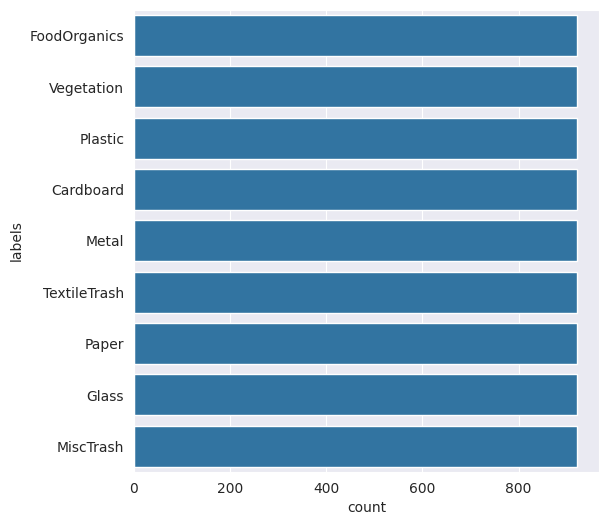

In [10]:
# Definisikan source path
dataset_path = "waste/dataset"

# Buat daftar yang menyimpan data untuk setiap nama file, path file, dan label dalam data
file_name = []
labels = []
full_path = []

# Ambil data nama file gambar, path file, dan label satu per satu dengan looping, dan simpan sebagai dataframe
for name in os.listdir(dataset_path):
    if name.endswith('.jpg'):
        full_path.append(os.path.join(dataset_path, name))
        label = name.split('_')[0]
        labels.append(label)
        file_name.append(name)

distribution_train = pd.DataFrame({"path": full_path, "file_name": file_name, "labels": labels})

# Plot distribusi gambar setiap kelas
Label = distribution_train['labels']
plt.figure(figsize = (6,6))
sns.set_style("darkgrid")
plot_data = sns.countplot(Label)

### Data Preprocessing

#### Split Dataset

In [11]:
# Dengan memanggil variabel mypath yang menampung folder dataset gambar
mypath = 'waste/dataset/'

file_name = []
labels = []
full_path = []

for path, subdirs, files in os.walk(mypath):
  for name in files:
    full_path.append(os.path.join(path, name))
    labels.append(name.split('_')[0])
    file_name.append(name)

# Memasukkan variabel yang sudah dikumpulkan dalam looping jadi sebuah dataframe
df = pd.DataFrame({"path": full_path, "file_name": file_name, "labels": labels})
df.groupby(["labels"]).size()

,0
labels,
Cardboard,921
FoodOrganics,921
Glass,921
Metal,921
MiscTrash,921
Paper,921
Plastic,921
TextileTrash,921
Vegetation,921


In [12]:
# Mendefinisikan variabel X = data path dan y = data label
X = df['path']
y = df['labels']

# Split dataset menjadi train (70%), test (15%), dan validation (15%)
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, random_state=300)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=300)

In [13]:
# Membuat dataframe untuk setiap set
df_tr = pd.DataFrame({'path': X_train, 'labels': y_train, 'set': "train"})
df_te = pd.DataFrame({'path': X_test, 'labels': y_test, 'set': "test"})
df_val = pd.DataFrame({'path': X_val, 'labels': y_val, 'set': "val"})

In [14]:
# Menampilkan panjang ukuran setiap dataframe
print('train_size', len(df_tr))
print('test_size', len(df_te))
print('validation_size', len(df_val))

train_size 5802
test_size 1244
validation_size 1243


In [15]:
# Gabungkan semua dataframe
df_all = pd.concat([df_tr, df_te, df_val], ignore_index=True)

print('===================================================== \n')
print(df_all.groupby(['set', 'labels']).size(), '\n')
print('===================================================== \n')

# Cek jumlah sample data
print(df_all.sample(5))


set    labels      
test   Cardboard       124
       FoodOrganics    139
       Glass           152
       Metal           136
       MiscTrash       135
       Paper           127
       Plastic         144
       TextileTrash    141
       Vegetation      146
train  Cardboard       666
       FoodOrganics    645
       Glass           623
       Metal           658
       MiscTrash       629
       Paper           676
       Plastic         637
       TextileTrash    635
       Vegetation      633
val    Cardboard       131
       FoodOrganics    137
       Glass           146
       Metal           127
       MiscTrash       157
       Paper           118
       Plastic         140
       TextileTrash    145
       Vegetation      142
dtype: int64 


                                                   path      labels    set
8135                   waste/dataset/Paper_Paper_74.jpg       Paper    val
1199  waste/dataset/Vegetation_aug_399_Vegetation_Ve...  Vegetation  train
361      

In [16]:
# Memanggil dataset asli (keseluruhan data gambar yang sesuai dengan labelnya)
datasource_path = "waste/dataset/"
# Membuat variabel Dataset, yang akan menampung data setelah dilakukan pembagian data training dan testing
dataset_path = "Dataset-Final/"

In [17]:
for index, row in tq(df_all.iterrows()):
    # Deteksi filepath
    file_path = row['path']
    if os.path.exists(file_path) == False:
            file_path = os.path.join(datasource_path,row['labels'],row['image'].split('.')[0])

    # Buat direktori tujuan folder
    if os.path.exists(os.path.join(dataset_path,row['set'],row['labels'])) == False:
        os.makedirs(os.path.join(dataset_path,row['set'],row['labels']))

    # Tentukan tujuan file
    destination_file_name = file_path.split('/')[-1]
    file_dest = os.path.join(dataset_path,row['set'],row['labels'],destination_file_name)

    # Salin file dari sumber ke tujuan
    if os.path.exists(file_dest) == False:
        shutil.copy2(file_path,file_dest)

0it [00:00, ?it/s]

## Modelling

Image Data Generator

In [18]:
import os

# Menfinisikan direktori u training, testing dan validasi
TRAIN_DIR = "Dataset-Final/train/"
TEST_DIR = "Dataset-Final/test/"
VAL_DIR = "Dataset-Final/val/"

# Definisikan kategori label dalam dataset
labels = ["Cardboard", "FoodOrganics", "FoodOrganics", "Glass", "Metal", "MiscTrash", "Paper", "Plastic", "TextileTrash", "Vegetation"]

# Membuat fungsi untuk menghitung jumlah gambar dalam setiap kategori
def count_images(directory, label):
    path = os.path.join(directory, label)
    return len(os.listdir(path)) if os.path.exists(path) else 0

# Menampilkan jumlah gambar dalam setiap kategori untuk train, test, dan val set
print("=" * 50)
print(f"{'Kategori':<20} {'Train':<10} {'Test':<10} {'Validation':<12}")
print("=" * 50)

for label in labels:
    train_count = count_images(TRAIN_DIR, label)
    test_count = count_images(TEST_DIR, label)
    val_count = count_images(VAL_DIR, label)

    print(f"{label:<20} {train_count:<10} {test_count:<10} {val_count:<12}")

print("=" * 50)

Kategori             Train      Test       Validation  
Cardboard            666        124        131         
FoodOrganics         645        139        137         
FoodOrganics         645        139        137         
Glass                623        152        146         
Metal                658        136        127         
MiscTrash            629        135        157         
Paper                676        127        118         
Plastic              637        144        140         
TextileTrash         635        141        145         
Vegetation           633        146        142         


In [19]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Melakukan augmentasi hanya untuk train set
train_datagen = ImageDataGenerator(
    preprocessing_function=tf.keras.applications.efficientnet.preprocess_input,
    rotation_range=25,       # Rotasi ringan (maks 25°)
    width_shift_range=0.2,   # Geser horizontal
    height_shift_range=0.2,  # Geser vertikal
    shear_range=0.15,        # Distorsi ringan
    zoom_range=0.2,          # Zoom in/out acak
    horizontal_flip=True,    # Flip gambar secara horizontal
    brightness_range=[0.8, 1.2],  # Variasi pencahayaan
    fill_mode='nearest'      # Isi area kosong dengan piksel terdekat

)

# Melakukan normalisasi tanpa augmentasi untuk validation & test set
val_test_datagen = ImageDataGenerator(
    preprocessing_function=tf.keras.applications.efficientnet.preprocess_input
)

# Train data generator
train_generator = train_datagen.flow_from_directory(
    TRAIN_DIR,
    batch_size=32,
    target_size=(224, 224),
    color_mode="rgb",
    class_mode='categorical',  # Karena punya banyak kelas
    shuffle=True               # Shuffle untuk melatih model dengan baik
)

# Validation data generator
validation_generator = val_test_datagen.flow_from_directory(
    VAL_DIR,
    batch_size=32,
    target_size=(224, 224),
    color_mode="rgb",
    class_mode='categorical',  # Karena punya banyak kelas
    shuffle=False              # Tidak perlu di-shuffle
)

# Test data generator
test_generator = val_test_datagen.flow_from_directory(
    TEST_DIR,
    batch_size=1,
    target_size=(224, 224),
    color_mode="rgb",
    class_mode='categorical',  # Karena ada banyak kelas
    shuffle=False              # Tidak perlu di-shuffle agar evaluasi tetap konsisten
)

# Cek jumlah kelas yang terdeteksi
print("Detected classes:", train_generator.class_indices)

Found 5802 images belonging to 9 classes.
Found 1243 images belonging to 9 classes.
Found 1244 images belonging to 9 classes.
Detected classes: {'Cardboard': 0, 'FoodOrganics': 1, 'Glass': 2, 'Metal': 3, 'MiscTrash': 4, 'Paper': 5, 'Plastic': 6, 'TextileTrash': 7, 'Vegetation': 8}


Membangun Model dengan Beberapa Skema Parameter Tunning

In [20]:
# dense lebih dalam
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.regularizers import l2

tf.keras.backend.clear_session()

num_classes = 9  # Dataset RealWaste: 9 kategori

model = Sequential([
    # FEATURE EXTRACTOR (dengan 5 convolution blocks)
    Conv2D(128, (3,3), activation='relu', padding='same', input_shape=(150,150,3), kernel_regularizer=l2(1e-4)),
    Conv2D(128, (3,3), activation='relu', padding='same', kernel_regularizer=l2(1e-4)),
    BatchNormalization(),
    MaxPooling2D((2,2)),
    Dropout(0.25),

    Conv2D(256, (3,3), activation='relu', padding='same', kernel_regularizer=l2(1e-4)),
    Conv2D(256, (3,3), activation='relu', padding='same', kernel_regularizer=l2(1e-4)),
    BatchNormalization(),
    MaxPooling2D((2,2)),
    Dropout(0.3),

    Conv2D(512, (3,3), activation='relu', padding='same', kernel_regularizer=l2(1e-4)),
    Conv2D(512, (3,3), activation='relu', padding='same', kernel_regularizer=l2(1e-4)),
    BatchNormalization(),
    MaxPooling2D((2,2)),
    Dropout(0.4),

    Conv2D(1024, (3,3), activation='relu', padding='same', kernel_regularizer=l2(1e-4)),
    BatchNormalization(),
    MaxPooling2D((2,2)),
    Dropout(0.5),

    Conv2D(1024, (3,3), activation='relu', padding='same', kernel_regularizer=l2(1e-4)),
    BatchNormalization(),
    MaxPooling2D((2,2)),
    Dropout(0.5),

    # CLASSIFIER (dengan 10 Fully Connected Dense Layers)
    Flatten(),

    Dense(4096, activation='relu', kernel_regularizer=l2(1e-4)),
    BatchNormalization(), Dropout(0.5),

    Dense(4096, activation='relu', kernel_regularizer=l2(1e-4)),
    BatchNormalization(), Dropout(0.5),

    Dense(2048, activation='relu', kernel_regularizer=l2(1e-4)),
    BatchNormalization(), Dropout(0.4),

    Dense(2048, activation='relu', kernel_regularizer=l2(1e-4)),
    BatchNormalization(), Dropout(0.4),

    Dense(1024, activation='relu', kernel_regularizer=l2(1e-4)),
    BatchNormalization(), Dropout(0.3),

    Dense(1024, activation='relu', kernel_regularizer=l2(1e-4)),
    BatchNormalization(), Dropout(0.3),

    Dense(512, activation='relu', kernel_regularizer=l2(1e-4)),
    BatchNormalization(), Dropout(0.3),

    Dense(512, activation='relu', kernel_regularizer=l2(1e-4)),
    BatchNormalization(), Dropout(0.3),

    Dense(256, activation='relu', kernel_regularizer=l2(1e-4)),
    BatchNormalization(), Dropout(0.25),

    Dense(128, activation='relu', kernel_regularizer=l2(1e-4)),
    BatchNormalization(), Dropout(0.25),

    # === OUTPUT LAYER ===
    Dense(num_classes, activation='softmax')
])

model.compile(
    optimizer=tf.keras.optimizers.AdamW(learning_rate=1e-4, weight_decay=1e-5),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

model.summary()

/usr/local/lib/python3.12/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 150, 150, 128)  │         3,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 150, 150, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 150, 150, 128)  │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 75, 75, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 75, 75, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 75, 75, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 75, 75, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 75, 75, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 37, 37, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 37, 37, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 37, 37, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 37, 37, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 37, 37, 512)    │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 18, 18, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 18, 18, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 18, 18, 1024)   │     4,719,616 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 18, 18, 1024)   │         4,096 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 9, 9, 1024)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 9, 9, 1024)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 9, 9, 1024)     │     9,438,208 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 9, 9, 1024)     │         4,096 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 4, 4, 1024)     │             0 │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 119,390,857 (455.44 MB)

 Trainable params: 119,353,481 (455.30 MB)

 Non-trainable params: 37,376 (146.00 KB)

transfer learning

In [21]:
# Base model EfficientNetB4
num_classes = 9

base_model = tf.keras.applications.EfficientNetB4(
    include_top=False,
    weights='imagenet',
    input_shape=(224, 224, 3)
)
base_model.trainable = False

# Bangun model
model = tf.keras.models.Sequential([
    layers.Input(shape=(224, 224, 3)),
    layers.Lambda(tf.keras.applications.efficientnet.preprocess_input),
    base_model,

    layers.Conv2D(64, (3,3), padding='same', activation='relu'),
    layers.BatchNormalization(),
    layers.Dropout(0.4),

    layers.Conv2D(128, (3,3), padding='same', activation='relu'),
    layers.BatchNormalization(),
    layers.Dropout(0.3),

    layers.GlobalAveragePooling2D(),

    layers.Dense(256, activation='relu'),
    layers.BatchNormalization(),
    layers.Dropout(0.5),
    layers.Dense(128, activation='relu'),
    layers.BatchNormalization(),
    layers.Dropout(0.3),

    layers.Dense(num_classes, activation='softmax')
])

# Compile
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=3e-4),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

print(model.summary())

71686520/71686520 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lambda (Lambda)                 │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetb4 (Functional)     │ (None, 7, 7, 1792)     │    17,673,823 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 7, 7, 64)       │     1,032,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_15          │ (None, 7, 7, 64)       │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_15 (Dropout)            │ (None, 7, 7, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_9 (Conv2D)               │ (None, 7, 7, 128)      │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_16          │ (None, 7, 7, 128)      │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_16 (Dropout)            │ (None, 7, 7, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 128)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_11 (Dense)                │ (None, 256)            │        33,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_17          │ (None, 256)            │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_17 (Dropout)            │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_12 (Dense)                │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_18          │ (None, 128)            │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_18 (Dropout)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_13 (Dense)                │ (None, 9)              │         1,161 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 18,849,320 (71.90 MB)

 Trainable params: 1,174,345 (4.48 MB)

 Non-trainable params: 17,674,975 (67.42 MB)

None


In [22]:
import numpy as np
from sklearn.utils.class_weight import compute_class_weight
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau

# Mengambil informasi label kelas dari train_generator
class_indices = train_generator.class_indices
num_classes = len(class_indices)                # total kelas dalam dataset
labels = list(class_indices.values())           # daftar indeks label

# Mengambil semua label dari dataset pelatihan
train_labels = train_generator.classes          # label numerik untuk seluruh gambar di train set

# Hitung bobot tiap kelas agar dataset lebih seimbang saat training
class_weights_values = compute_class_weight(
    class_weight='balanced',                    # metode penyeimbang otomatis
    classes=np.array(labels),                   # kelas yang ada
    y=train_labels                              # label sebenarnya
)

# Ubah hasilnya menjadi dictionary {kelas: bobot}
class_weights = {i: class_weights_values[i] for i in range(num_classes)}

# Menampilkan hasil perhitungan bobot tiap kelas
print("Bobot kelas (class weights):")
for k, v in class_weights.items():
    print(f"  Kelas {k} → Bobot: {v:.3f}")

# Callback
callbacks = [
    EarlyStopping(monitor='val_loss', patience=7, restore_best_weights=True),
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3),
    ModelCheckpoint('best_realwaste_model.keras', save_best_only=True)
]

# Training awal
history_1 = model.fit(
    train_generator,
    epochs=50,
    validation_data=validation_generator,
    callbacks=callbacks
)

Bobot kelas (class weights):
  Kelas 0 → Bobot: 0.968
  Kelas 1 → Bobot: 0.999
  Kelas 2 → Bobot: 1.035
  Kelas 3 → Bobot: 0.980
  Kelas 4 → Bobot: 1.025
  Kelas 5 → Bobot: 0.954
  Kelas 6 → Bobot: 1.012
  Kelas 7 → Bobot: 1.015
  Kelas 8 → Bobot: 1.018


/usr/local/lib/python3.12/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/50
182/182 ━━━━━━━━━━━━━━━━━━━━ 222s 887ms/step - accuracy: 0.3433 - loss: 2.1141 - val_accuracy: 0.6018 - val_loss: 1.2293 - learning_rate: 3.0000e-04
Epoch 2/50
182/182 ━━━━━━━━━━━━━━━━━━━━ 96s 525ms/step - accuracy: 0.6294 - loss: 1.1334 - val_accuracy: 0.7273 - val_loss: 0.7832 - learning_rate: 3.0000e-04
Epoch 3/50
182/182 ━━━━━━━━━━━━━━━━━━━━ 96s 525ms/step - accuracy: 0.6925 - loss: 0.9124 - val_accuracy: 0.7595 - val_loss: 0.6651 - learning_rate: 3.0000e-04
Epoch 4/50
182/182 ━━━━━━━━━━━━━━━━━━━━ 95s 520ms/step - accuracy: 0.7189 - loss: 0.8702 - val_accuracy: 0.7635 - val_loss: 0.6738 - learning_rate: 3.0000e-04
Epoch 5/50
182/182 ━━━━━━━━━━━━━━━━━━━━ 96s 523ms/step - accuracy: 0.7452 - loss: 0.7489 - val_accuracy: 0.7683 - val_loss: 0.6541 - learning_rate: 3.0000e-04
Epoch 6/50
182/182 ━━━━━━━━━━━━━━━━━━━━ 95s 521ms/step - accuracy: 0.7672 - loss: 0.7051 - val_accuracy: 0.7940 - val_loss: 0.5936 - learning_rate: 3.0000e-04
Epoch 7/50
182/182 ━━━━━━━━━━━━━━━━━━━━ 96s 5

In [23]:
test_loss, test_acc = model.evaluate(test_generator)
print(f"Akurasi pada data uji: {test_acc*100:.2f}%")

1244/1244 ━━━━━━━━━━━━━━━━━━━━ 30s 13ms/step - accuracy: 0.8665 - loss: 0.3669
Akurasi pada data uji: 86.66%


## Evaluasi dan Visualisasi

1244/1244 ━━━━━━━━━━━━━━━━━━━━ 16s 13ms/step - accuracy: 0.8665 - loss: 0.3669
Akurasi model pada data uji: 86.66%


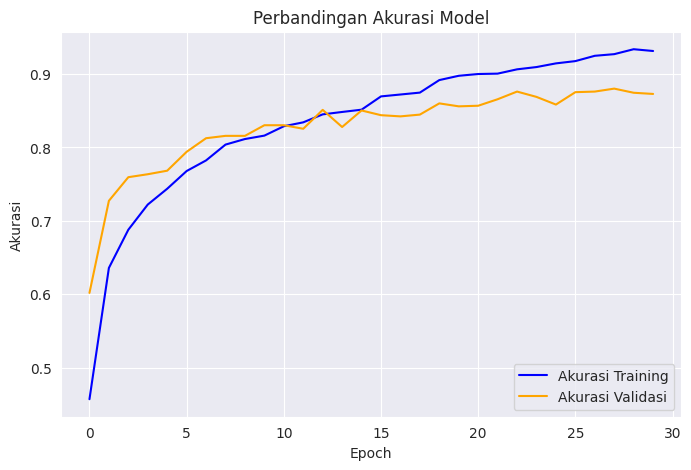

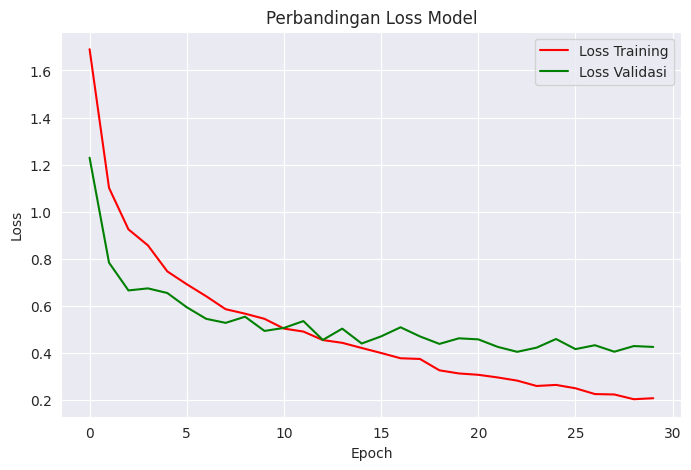

In [24]:
# Evaluasi performa model menggunakan data uji (test set)
test_loss, test_accuracy = model.evaluate(test_generator)
print(f"Akurasi model pada data uji: {test_accuracy * 100:.2f}%")

# Memvisualisasi hasil pelatihan
import matplotlib.pyplot as plt

# Grafik akurasi (Training vs Validation)
plt.figure(figsize=(8, 5))
plt.plot(history_1.history['accuracy'], label='Akurasi Training', color='blue')
plt.plot(history_1.history['val_accuracy'], label='Akurasi Validasi', color='orange')
plt.title('Perbandingan Akurasi Model')
plt.xlabel('Epoch')
plt.ylabel('Akurasi')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

# Grafik loss (Training vs Validation)
plt.figure(figsize=(8, 5))
plt.plot(history_1.history['loss'], label='Loss Training', color='red')
plt.plot(history_1.history['val_loss'], label='Loss Validasi', color='green')
plt.title('Perbandingan Loss Model')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(loc='upper right')
plt.grid(True)
plt.show()

1244/1244 ━━━━━━━━━━━━━━━━━━━━ 26s 12ms/step


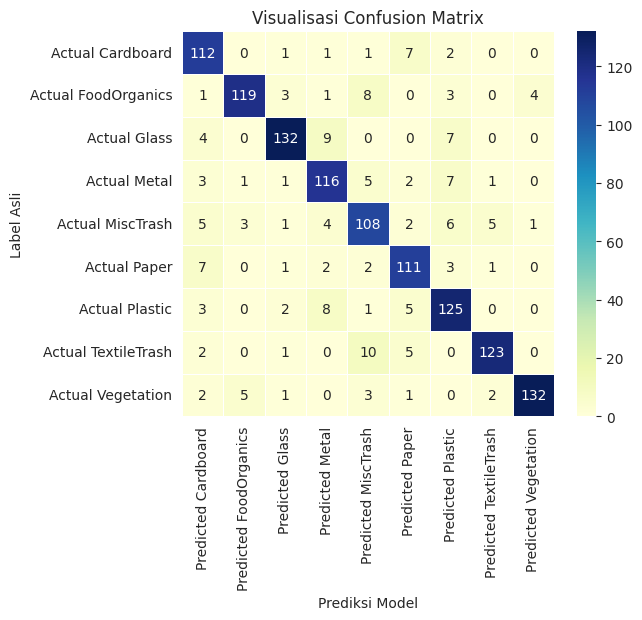


Laporan Klasifikasi (Classification Report):
              precision    recall  f1-score   support

   Cardboard     0.8058    0.9032    0.8517       124
FoodOrganics     0.9297    0.8561    0.8914       139
       Glass     0.9231    0.8684    0.8949       152
       Metal     0.8227    0.8529    0.8375       136
   MiscTrash     0.7826    0.8000    0.7912       135
       Paper     0.8346    0.8740    0.8538       127
     Plastic     0.8170    0.8681    0.8418       144
TextileTrash     0.9318    0.8723    0.9011       141
  Vegetation     0.9635    0.9041    0.9329       146

    accuracy                         0.8666      1244
   macro avg     0.8679    0.8666    0.8663      1244
weighted avg     0.8703    0.8666    0.8675      1244



In [25]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, classification_report

# Pastikan test generator di-reset sebelum melakukan prediksi
test_generator.reset()

# Melakukan prediksi pada seluruh data uji
predictions = model.predict(test_generator, verbose=1)  # verbose=1 untuk menampilkan progres

# Mengambil indeks kelas dengan probabilitas tertinggi
predicted_classes = np.argmax(predictions, axis=1)

# Membuat Confusion Matrix
cm = confusion_matrix(test_generator.classes, predicted_classes)

# Menyesuaikan label dengan kelas dataset
class_labels = list(test_generator.class_indices.keys())

# Konversi hasil confusion matrix ke DataFrame supaya lebih mudah divisualisasikan
cm_df = pd.DataFrame(cm,
                     index=[f"Actual {cls}" for cls in class_labels],
                     columns=[f"Predicted {cls}" for cls in class_labels])

# Visualisasi confusion matrix menggunakan heatmap
plt.figure(figsize=(6, 5))
sns.heatmap(cm_df, annot=True, fmt="d", cmap="YlGnBu", linewidths=0.5)
plt.title("Visualisasi Confusion Matrix")
plt.xlabel("Prediksi Model")
plt.ylabel("Label Asli")
plt.show()

# Menampilkan Classification Report
print("\nLaporan Klasifikasi (Classification Report):")
print(classification_report(test_generator.classes,
                            predicted_classes,
                            target_names=class_labels,
                            digits=4))

## Konversi Model

In [26]:
# Simpan model dalam format SavedModel
model.export("mymodel")

Saved artifact at 'mymodel'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name='keras_tensor_531')
Output Type:
  TensorSpec(shape=(None, 9), dtype=tf.float32, name=None)
Captures:
  140560056806928: TensorSpec(shape=(1, 1, 1, 3), dtype=tf.float32, name=None)
  140560056808464: TensorSpec(shape=(1, 1, 1, 3), dtype=tf.float32, name=None)
  140560997209040: TensorSpec(shape=(), dtype=tf.resource, name=None)
  140560997204624: TensorSpec(shape=(), dtype=tf.resource, name=None)
  140560997208656: TensorSpec(shape=(), dtype=tf.resource, name=None)
  140560997210192: TensorSpec(shape=(), dtype=tf.resource, name=None)
  140560997210768: TensorSpec(shape=(), dtype=tf.resource, name=None)
  140560997209616: TensorSpec(shape=(), dtype=tf.resource, name=None)
  140560997209424: TensorSpec(shape=(), dtype=tf.resource, name=None)
  140560997210576: TensorSpec(shape=(), dtype=tf.resource, name=None)
  1

In [27]:
import shutil
# Kompres dan download jika ingin disimpan lokal
shutil.make_archive('mymodel', 'zip', 'mymodel')
from google.colab import files
files.download('mymodel.zip')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## Inference Sederhana

In [28]:
import tensorflow as tf
import numpy as np
from tensorflow.keras.preprocessing import image
from keras.layers import TFSMLayer
import matplotlib.pyplot as plt
from PIL import Image
from google.colab import files
import os

# Load model hasil export()
model_path = "mymodel"
loaded_model = TFSMLayer(model_path, call_endpoint="serve")

# Label kelas
class_labels = [
    'Cardboard',
    'Food Organics',
    'Glass',
    'Metal',
    'Miscellaneous Trash',
    'Paper',
    'Plastic',
    'Textile Trash',
    'Vegetation'
]

# Fungsi prediksi gambar
def predict_image(img_path, target_size=(224, 224)):
    if not os.path.exists(img_path):
        print("File gambar tidak ditemukan:", img_path)
        return None

    # Tampilkan gambar
    img_show = Image.open(img_path)
    plt.imshow(img_show)
    plt.axis('off')
    plt.show()

    # Load dan preprocessing gambar
    img = image.load_img(img_path, target_size=target_size)
    img_array = image.img_to_array(img)
    img_array = tf.keras.applications.efficientnet.preprocess_input(img_array)
    img_array = np.expand_dims(img_array, axis=0)

    # Prediksi
    predictions = loaded_model(img_array)

    # Karena TFSMLayer mengembalikan dictionary, ambil output utamanya
    if isinstance(predictions, dict):
        predictions = list(predictions.values())[0]

    predicted_class_idx = np.argmax(predictions)
    confidence = np.max(predictions)

    print(f"Prediksi: {class_labels[predicted_class_idx]} ({confidence*100:.2f}%)")
    return class_labels[predicted_class_idx], confidence

Saving sampah1.png to sampah1.png


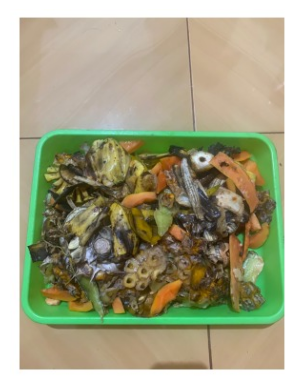

🧾 Prediksi: Food Organics (96.17%)


In [29]:
# Upload gambar dan prediksi
uploaded = files.upload()
for filename in uploaded.keys():
    predict_image(filename)